In [1]:
import numpy as np
import cv2

import matplotlib.pyplot as plt
%matplotlib inline

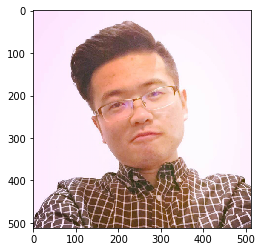

In [3]:
height = 512
width = 512

# IMAGE_DIR = '/input/StyleTransfer/images'
IMAGE_DIR = './images'

content_image = cv2.imread('{}/content/wikke.png'.format(IMAGE_DIR))
content_image = cv2.cvtColor(content_image, cv2.COLOR_BGR2RGB)
content_image = cv2.resize(content_image, (width, height))
plt.imshow(content_image)

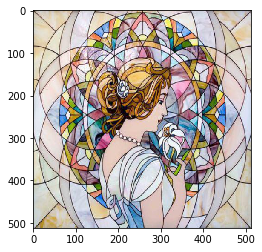

In [3]:
style_image = cv2.imread('{}/style/stained_glass.jpg'.format(IMAGE_DIR))
style_image = cv2.cvtColor(style_image, cv2.COLOR_BGR2RGB)
style_image = cv2.resize(style_image, (width, height))
plt.imshow(style_image)

In [4]:
content_image = np.expand_dims(content_image, axis=0)
style_image = np.expand_dims(style_image, axis=0)

# content_image.shape, style_image.shape
# ((1, 512, 512, 3), (1, 512, 512, 3))

content_image = np.asarray(content_image, dtype='float32')
style_image = np.asarray(style_image, dtype='float32')

content_image[:, :, :, 0] -= 103.939
content_image[:, :, :, 1] -= 116.779
content_image[:, :, :, 2] -= 123.68
style_image[:, :, :, 0] -= 103.939
style_image[:, :, :, 1] -= 116.779
style_image[:, :, :, 2] -= 123.68

# RGB -> BGR
content_image = content_image[:, :, :, ::-1]
style_image = style_image[:, :, :, ::-1]

In [5]:
from keras import backend as K

# 注意，这里content和style是Variable，而combination是Placeholder
# 也就是说，训练过程中，content和style都是已知量，而combination是从随机数开始，要生成那个图片
content = K.variable(content_image)
style = K.variable(style_image)
combination = K.placeholder((1, width, height, 3))

input_tensor = K.concatenate([content, style, combination], axis=0)

Using TensorFlow backend.


In [6]:
from keras.applications import VGG16
model = VGG16(input_tensor=input_tensor, weights='imagenet', include_top=False)

layer_dict = dict([(layer.name, layer.output) for layer in model.layers])
layer_dict

{'block1_conv1': <tf.Tensor 'block1_conv1/Relu:0' shape=(3, 512, 512, 64) dtype=float32>,
 'block1_conv2': <tf.Tensor 'block1_conv2/Relu:0' shape=(3, 512, 512, 64) dtype=float32>,
 'block1_pool': <tf.Tensor 'block1_pool/MaxPool:0' shape=(3, 256, 256, 64) dtype=float32>,
 'block2_conv1': <tf.Tensor 'block2_conv1/Relu:0' shape=(3, 256, 256, 128) dtype=float32>,
 'block2_conv2': <tf.Tensor 'block2_conv2/Relu:0' shape=(3, 256, 256, 128) dtype=float32>,
 'block2_pool': <tf.Tensor 'block2_pool/MaxPool:0' shape=(3, 128, 128, 128) dtype=float32>,
 'block3_conv1': <tf.Tensor 'block3_conv1/Relu:0' shape=(3, 128, 128, 256) dtype=float32>,
 'block3_conv2': <tf.Tensor 'block3_conv2/Relu:0' shape=(3, 128, 128, 256) dtype=float32>,
 'block3_conv3': <tf.Tensor 'block3_conv3/Relu:0' shape=(3, 128, 128, 256) dtype=float32>,
 'block3_pool': <tf.Tensor 'block3_pool/MaxPool:0' shape=(3, 64, 64, 256) dtype=float32>,
 'block4_conv1': <tf.Tensor 'block4_conv1/Relu:0' shape=(3, 64, 64, 512) dtype=float32>,
 'b

In [7]:
content_weight = 0.025
style_weight = 5.0
total_variation_weight = 1.0

loss = K.variable(0.)

# Content Loss

In [9]:
def content_loss(content, combination):
    return K.sum(K.square(combination - content))

_layer = layer_dict['block2_conv2']
content_features = _layer[0, :, :, :]
combination_features = _layer[2, :, :, :]

loss += content_weight * content_loss(content_features, combination_features)

# Style Loss

In [11]:
# This is what allows them to **capture information about style independent of content**
def gram_matrix(x):
    # permute_dimensions 重新排列组合dimension
    # batch_flatten, Turn a nD tensor into a 2D tensor with same 0th dimension
        # 相当于batch中的每一项flatten，但是若干batch不变
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    # transpose 沿着对角线转置
    gram = K.dot(features, K.transpose(features))
    return gram

In [12]:
def style_loss(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = height * width
    # TODO Why  / (4. * (channels ** 2) * (size ** 2))
    return K.sum(K.square(S - C)) / (4. * (channels ** 2) * (size ** 2))

_layers = ['block1_conv2', 'block2_conv2', 'block3_conv3', 'block4_conv3', 'block5_conv3']
for _name in _layers:
    _layer = layer_dict[_name]
    style_features = _layer[1, :, :, :]
    combination_features = _layer[2, :, :, :]
    loss += (style_weight / len(_layers)) * style_loss(style_features, combination_features)

# Total Variation Loss

In [12]:
# (a regularisation term) that encourages spatial smoothness.
# 相当于图片在height和width方向错一个位置，然后让其差异尽可能小，从而不noisy
# TODO reduce this
def total_variation_loss(x):
    a = K.square(x[:, :height-1, :width-1, :] - x[:, 1:, :width-1, :])
    b = K.square(x[:, :height-1, :width-1, :] - x[:, :height-1, 1:, :])
    return K.sum(K.pow(a + b, 1.25))

loss += total_variation_weight * total_variation_loss(combination)

In [13]:
grads = K.gradients(loss, combination)

In [14]:
loss

<tf.Tensor 'add_5:0' shape=() dtype=float32>

In [15]:
combination

<tf.Tensor 'Placeholder:0' shape=(1, 512, 512, 3) dtype=float32>

In [16]:
grads

[<tf.Tensor 'gradients/concat_grad/Slice_2:0' shape=(1, 512, 512, 3) dtype=float32>]

In [17]:
outputs = [loss]
outputs += grads

In [18]:
outputs

[<tf.Tensor 'add_5:0' shape=() dtype=float32>,
 <tf.Tensor 'gradients/concat_grad/Slice_2:0' shape=(1, 512, 512, 3) dtype=float32>]

In [19]:
#function( inputs, outputs, updates=None, **kwargs)
# combination为输入，outputs为输出。最开始combination是一些随机数，要去生成那个图片
model_func = K.function([combination], outputs)
model_func

In [20]:
def eval_loss_and_grads(x):
    x = x.reshape((1, height, width, 3))
    # 从x输入，经过model_func，输出outs，就是loss和grads，如前面所定义
    outs = model_func([x])
    loss_value = outs[0]
    grad_values = outs[1].flatten().astype('float64')
    return loss_value, grad_values

class Evaluator(object):
    
    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        assert self.loss_value is None
        loss_value, grad_values = eval_loss_and_grads(x)
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

evaluator = Evaluator()

In [21]:
x = np.random.uniform(0, 255, (1, height, width, 3)) - 128.
x.shape

(1, 512, 512, 3)

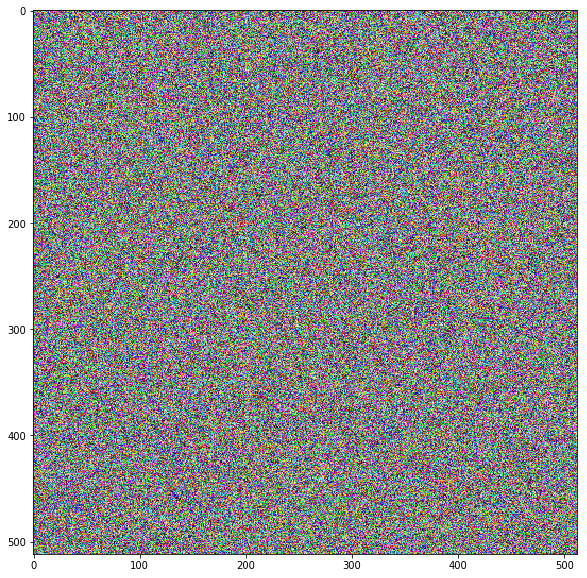

In [22]:
plt.figure(1, figsize=(10,10))
plt.imshow(x[0])
plt.show()

iter 0


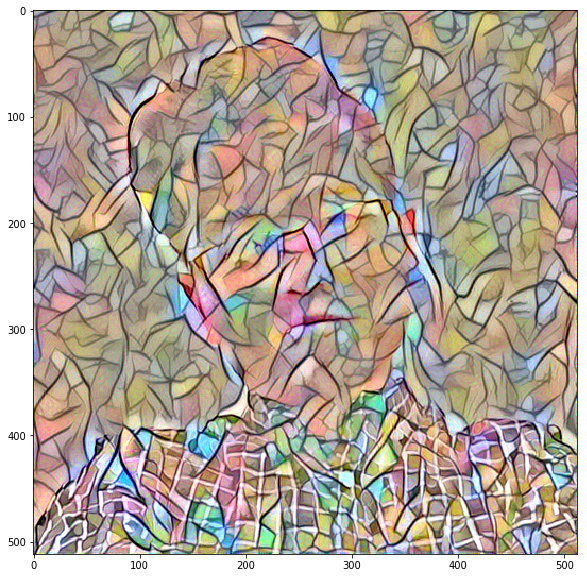

iter 1


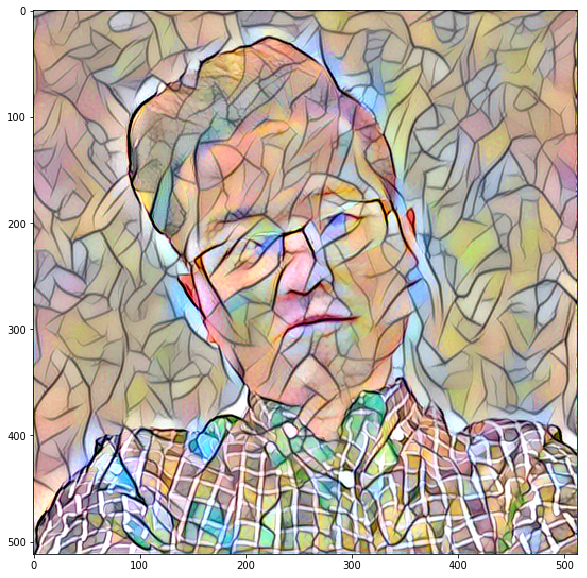

iter 2


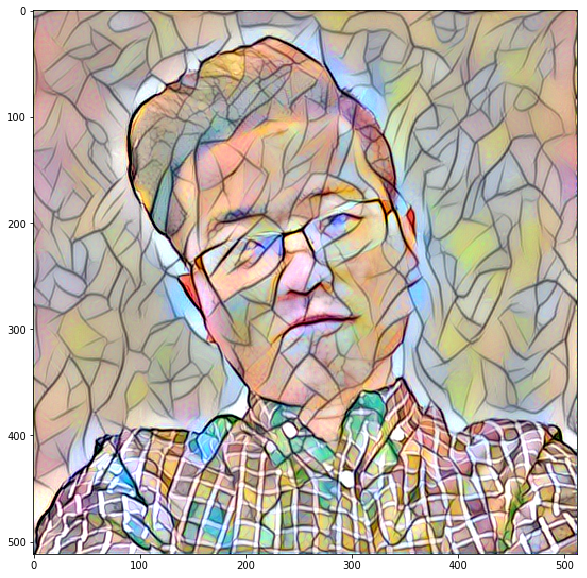

iter 3


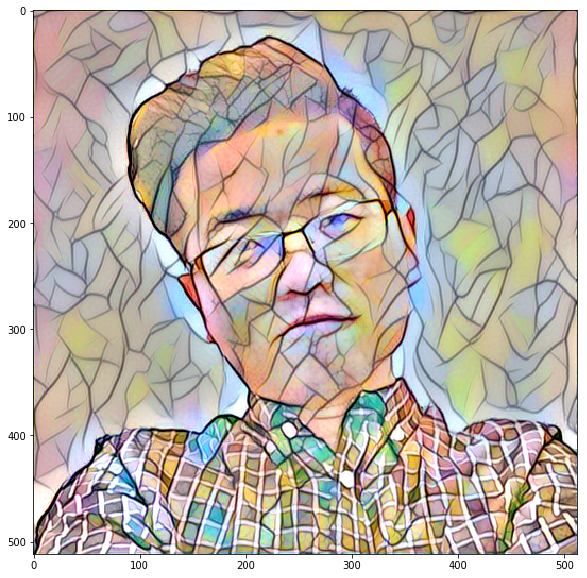

iter 4


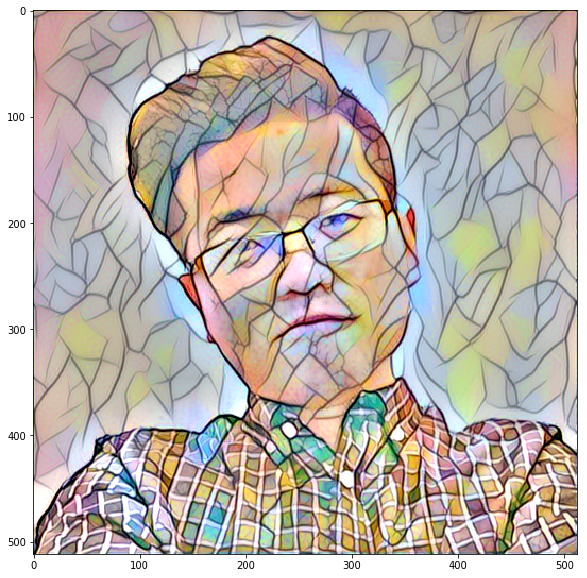

iter 5


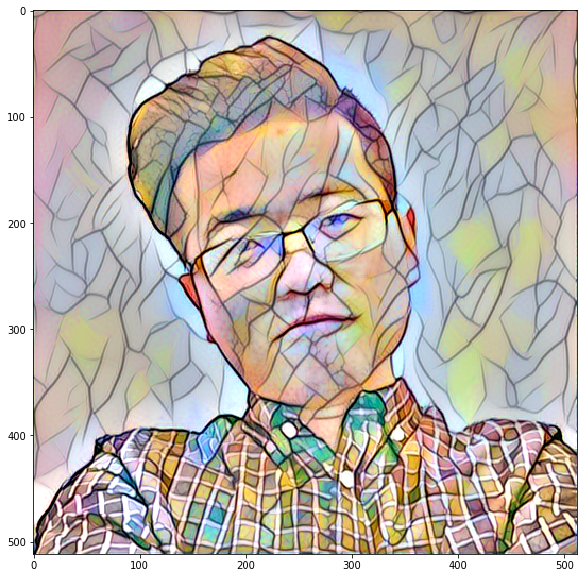

iter 6


KeyboardInterrupt: 

In [31]:
from scipy.optimize import fmin_l_bfgs_b

iterations = 100

for i in range(iterations):
    print('iter {}'.format(i))
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(), fprime=evaluator.grads, maxfun=20)
    
    y = x.copy()
    y = y.reshape((height, width, 3))
    y = y[:, :, ::-1]
    y[:, :, 0] += 103.939
    y[:, :, 1] += 116.779
    y[:, :, 2] += 123.68
    y = np.clip(y, 0, 255).astype('uint8')
    
    plt.figure(i, figsize=(10, 10))
    plt.imshow(y)
    plt.show()

## 没有total_variation_loss的情况

iter 0


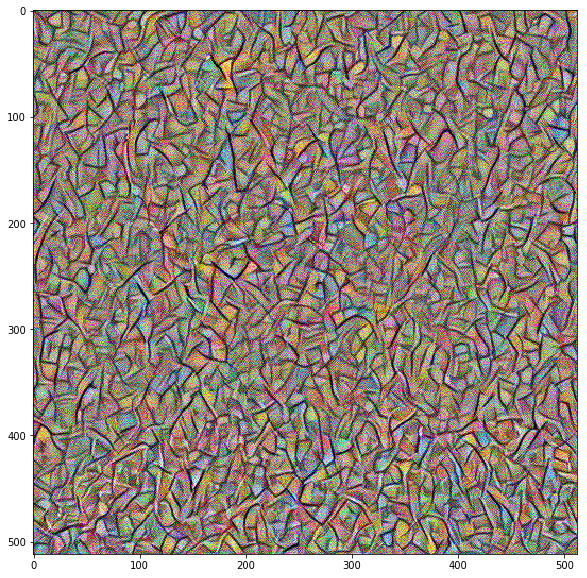

iter 1


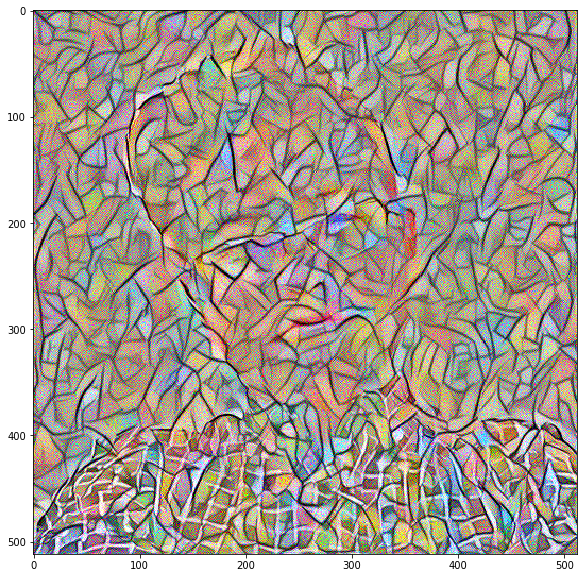

iter 2


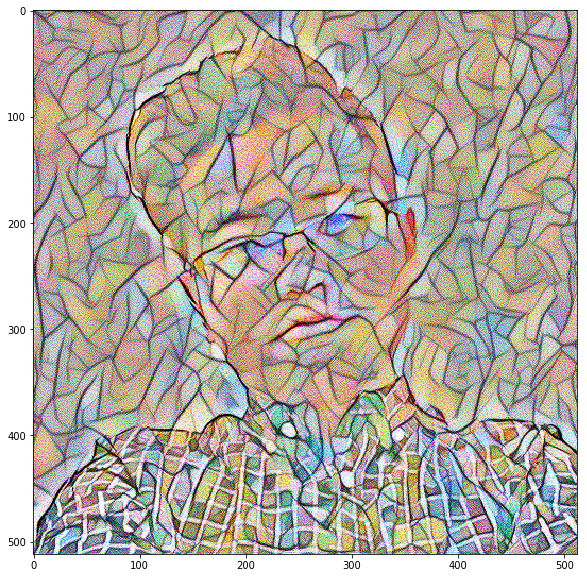

iter 3


KeyboardInterrupt: 

In [23]:
from scipy.optimize import fmin_l_bfgs_b

iterations = 100

for i in range(iterations):
    print('iter {}'.format(i))
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(), fprime=evaluator.grads, maxfun=20)
    
    y = x.copy()
    y = y.reshape((height, width, 3))
    y = y[:, :, ::-1]
    y[:, :, 0] += 103.939
    y[:, :, 1] += 116.779
    y[:, :, 2] += 123.68
    y = np.clip(y, 0, 255).astype('uint8')
    
    plt.figure(i, figsize=(10, 10))
    plt.imshow(y)
    plt.show()